# Сверточные нейронные сети

## Мотивация

Прежде чем изучать устройство сверточных нейросетей, давайте поговорим о том, зачем они вообще нужны.

Мы уже изучили то, как устроены полносвязные нейросети. Почему бы не использовать их для обработки изображений? Зачем нужно изобретать какой-то новый вид нейросетей?

Ответ: потому что **полносвязные нейросети очень неэффективны для обработки изображений**. Давайте обсудим, почему.

Рассмотрим задачу классификации изображений из датасета MNIST. MNIST — датасет черно-белых изображений рукописных цифр от 0 до 9: всего 10 классов. Изображения в датасете имеют размер 28х28 пикселей.

На этом датасете можно решать задачу классификации изображений на 10 классов.

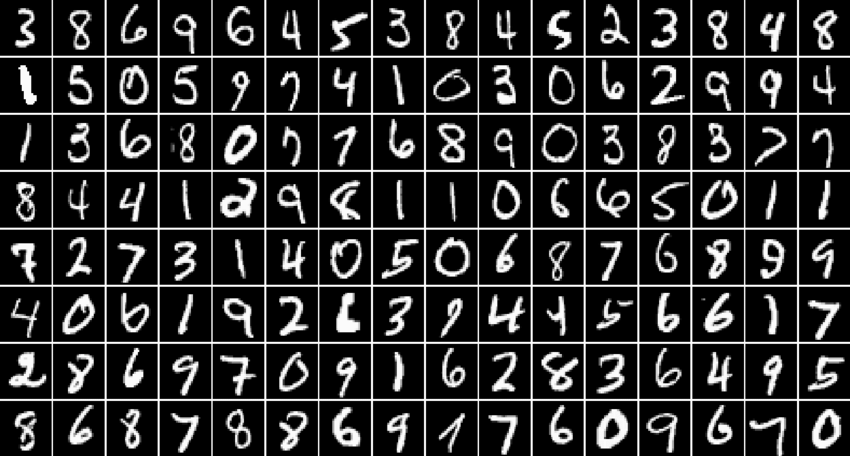

Чтобы решить задачу классификации картинок MNIST с помощью нейросетей, нужно научиться подавать картинку сети на вход. Полносвязная нейросеть принимает на вход данные, представленные в виде вектора чисел. Если у нейросети в первом слое N нейронов, то входящий вектор чисел должен быть размера N.

Черно-белая картинка из датасета MNIST представляет собой двумерную матрицу чисел. Числа матрицы отражают яркость соответствующего пикселя картинки:


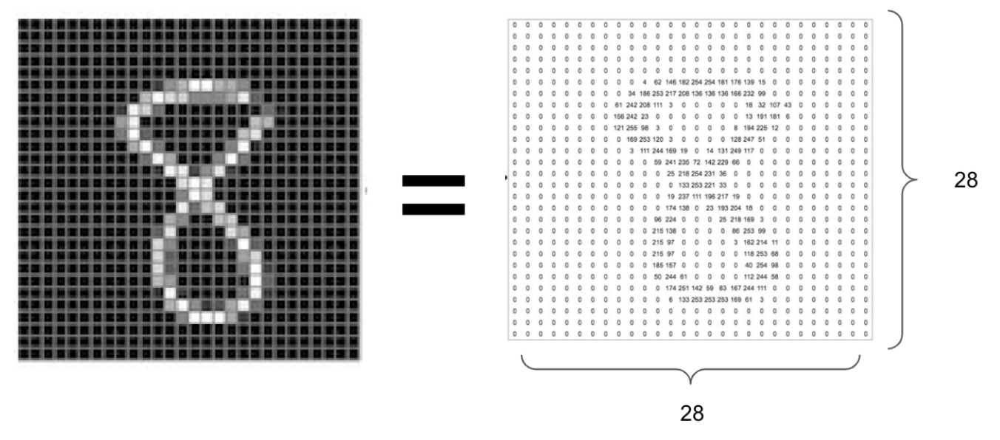

Чтобы подать картинку на вход нейросети, нужно эту матрицу растянуть в вектор (на английском эта операция "растягивания" матрицы в вектор называется flatten; мы к ней еще вернемся позже). Сделать это можно, например, так: склеить все строки матрицы в один длинный вектор. Тогда из матрицы размера 28х28 получится вектор длины 784. Значит, первый слой нейросети, которая будет принимать на вход такой вектор, должен будет содержать 784 нейрона. Подавая таким способом изображения на вход полносвязный нейросети, мы можем обучить нейросеть решать задачу классификации картинок MNIST.

**У такого подхода к построению сети для обработки изображений есть недостатки**.
Вот какие:

1. При таком подходе в первом слое нейросети получается очень много нейронов, и, соответственно, обучаемых параметров (весов). Такая нейросеть легко переобучится.

2. Второй недостаток: полносвязная нейросеть обрабатывает разные части картинки по-разному, даже если на них расположены одинаковые объекты.


3. Обычно объекты на изображениях расположены компактно: Это принцип локальности (locality) объектов. И чтобы найти нужный объект на картинке, нужно сконцентрировать взгляд на локальных частях картинки, а не смотреть сразу на все изображение целиком. Полносвязная же нейросеть "смотрит" на всю картинку целиком: каждый ее слой обрабатывает абсолютно все пиксели исходной картинки.




## Свертки

Операция свертки состоит в рименении фильтра. **Фильтр** (или, другое название, ядро; англ kernel) — это матрица чисел, которая "проходится" по исходной скользящим окном и вычисляет сумму произведений элементов самой себя с элементами исходной матрицы.


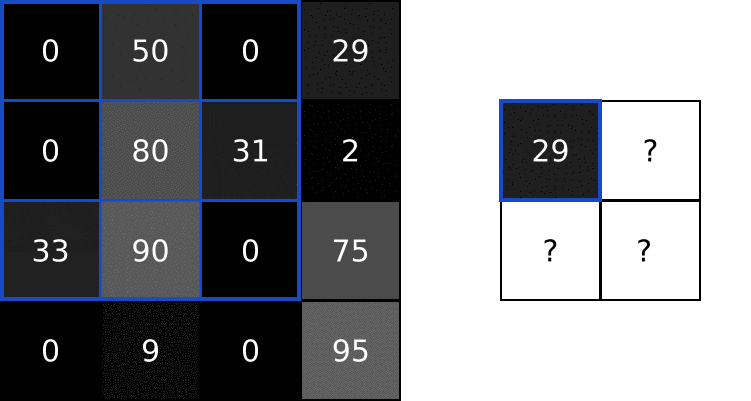

Заметим, что размер карты активации после свертки стал меньше, чем размер изначального изображения. Общая формула размера карты активации такая:

$$m = i - f + 1,$$

где:
- m — размер карты активации;
- i — размер изображения;
- f — размер фильтра.


Существует набор известных фильтров, выделяющих определенные характеристики изображений. Например, вертикальный фильтр Собеля способен выделять вертикальные контуры на изображении, а горизонтальный - горизонтальные

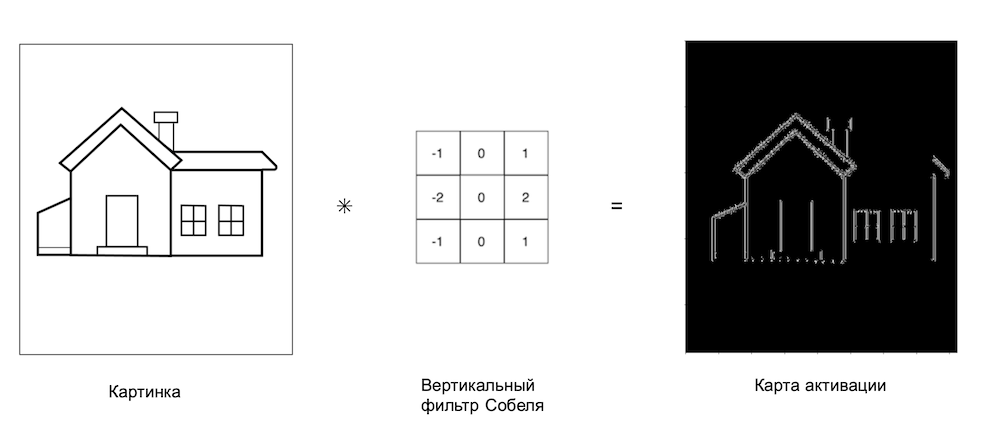

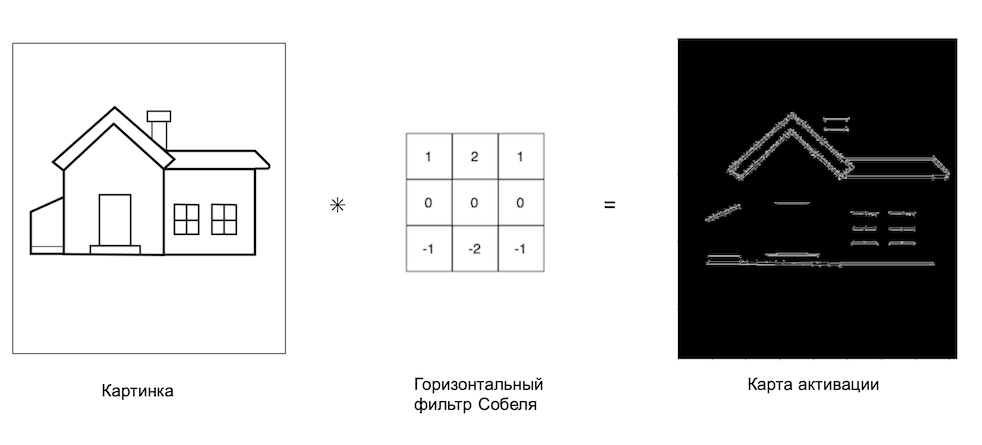

Однако, заранее невозможно предугадать, какой фильтр понадобится для решения той или иной задачи, поэтому лучший путь - сделать их **обучаемыми**

Таким образом, обучаемыми параметрами сверточной нейросети являются все веса всех фильтров (веса — числа в матрице фильтра) и веса полносвязной части сети.
Обучается сверточная нейросеть с помощью знакомого нам алгоритма backpropagation. Для обучения весов сверточных слоев ничего дополнительно изобретать не нужно.

Обычно сверточные блоки объединяют в слои:

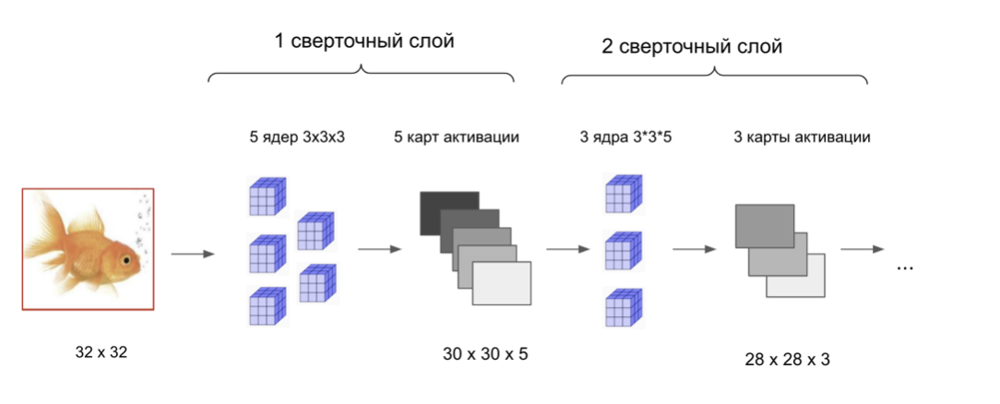

**Принцип работы сверточной нейросети**:

- Первый сверточный слой. Сворачиваем входящую картинку несколькими (например, пятью) фильтрами, получаем пять карт активаций. Так как входная картинка цветная, т.е. представлена трехмерной матрицей, то фильтры — также трехмерные матрицы. Пусть они будут размера 4х4х3. Полученные карты активации после свертки такими фильтрами — двумерные.
- Второй сверточный слой. Им мы сворачиваем карты активации, которые получились на выходе предыдущего слоя. Пять двумерных карт активаций можно представить как одну трехмерную матрицу, у которой третья размерность — 5. Это как будто картинка, у которой не 3 цветовых канала, а 5. Такую трехмерную матрицу можно свернуть трехмерными свертками, у которых третья размерность — тоже 5. Пусть это будут три свертки размерности 3х3х5. На выходе этого слоя получим 3 двумерные карты активации.
- Далее можно добавлять еще слои сверток с разным количеством и размерами фильтров. После последнего слоя свертки нужно растянуть все карты активации последнего слоя в векторы (flatten), конкатенировать их и подать на вход полносвязной части сети, как мы делали выше.



**Какой смысл в нескольких слоях сверток?** Дело в том, что каждый последующий слой сверток сворачивает карты активации, выданные предыдущим слоем. И в обученной нейросети получается так, что каждый следующий слой сверток реагирует на более высокоуровневую и сложную информацию, которая присутствует на входном изображении.

Первый слой выделяет из изображения информацию, где на изображении находятся простые линии: вертикальные, горизонтальные, диагональные, etc.
Каждый последующий слой сверток реагирует на более высокоуровневые паттерны: части тела кота, рыбы, глаза, уши и т.д.


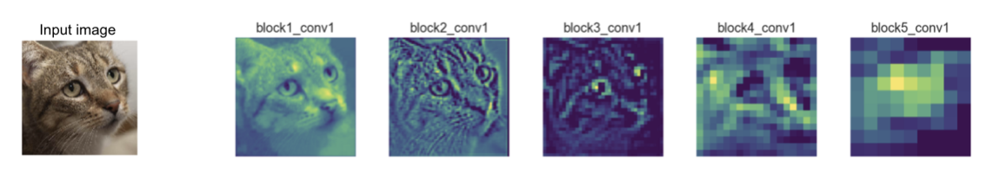

**Подведем итог. Каким образом сверточные нейросети решают задачу классификации:**
-
Сверточные слои выделяют из входного изображения наличие определенных паттернов, характерных для того или иного класса (наличие головы кота, собаки, хвоста самолета, кузова машины и т.д.). В нейросети активируются те фильтры, которые обучались реагировать на паттерны того типа, которые присутствуют на изображении.
- В итоге карты активации последнего слоя сети содержат информацию о том, какие из этих паттернов на входном изображении есть, а каких — нет.
- Карты активации последнего слоя затем подаются на вход полносвязной части сети, которая по информации из карт определяет, какой именно объект изображен на входной картинке.


## Инструменты работы со свертками

### 1. Функции активации

После всех сверточных слоев сети нужны функции активации. Чаще всего, как и в полносвязных сетях, для сверток используется функция активации ReLU. Функция активации действует поэлементно на каждый пиксель карты активации:


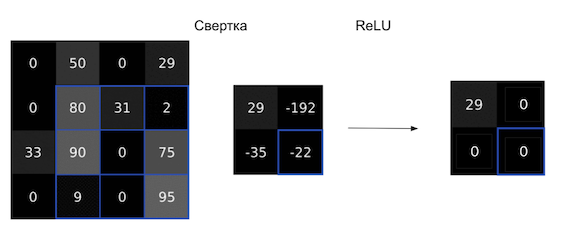

### 2. Pooling

Pooling — это операция уменьшения карт активации.

Проивзодится она следующим образом:
- Берем карту активации, делим ее на квадраты размера два на два;
- Из каждого квадрата два на два берем только одно число: максимальное число в этом квадрате;
- Записываем эти числа вместо каждого квадрата два на два. Так мы из карты активации размера (n x n) получаем карту активации размера (n/2 x n/2)

Такая операция называется MaxPooling с ядром размера 2. Ядро размера 2, потому что мы делили карту активации на квадраты размера 2х2.



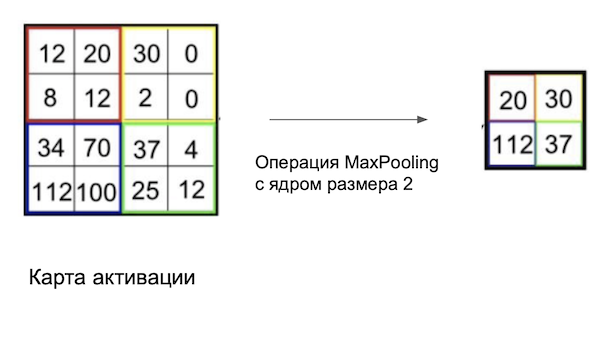

**Заметим тут, что у пулинга нет обучаемых параметров**: это просто функция, которая берет на вход карту активации и уменьшает ее в два раза определенным образом. Поэтому пулинг не делает количество обучаемых параметров сети больше.
Операцию пулинга можно добавлять после любых сверточных слоев сети. Ну, если размеры карт активаций позволяют, конечно.

### 3. Padding

Padding — это добавление к карте активации рамки из нулей. Ниже вы видите пример добавления паддинга размера один к карте активации размера четыре на четыре. Добавляем рамку из нулей толщиной один, но получаем, что длина и ширина карты активации увеличивается на два.

Это делается с целью регулирования размера выходной карты активации.

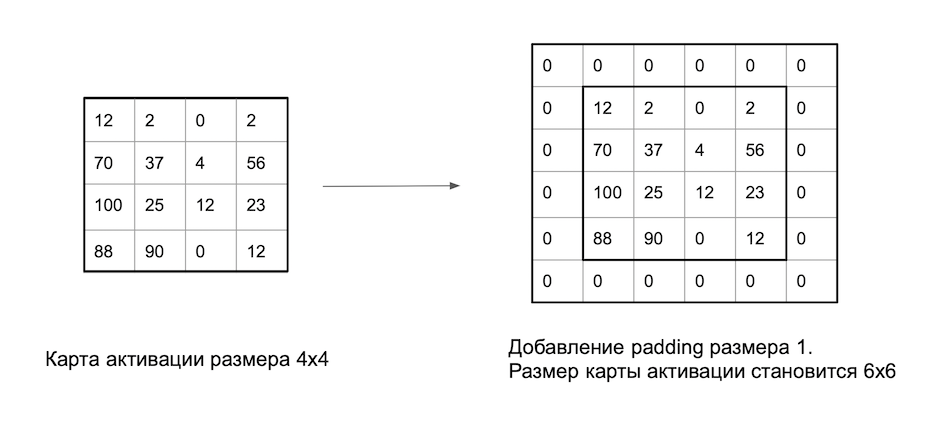

## Пример: классификация изображений

На практике мы будем решать задачу классификации картинок CIFAR на 10 классов с помощью сверточных нейросетей.



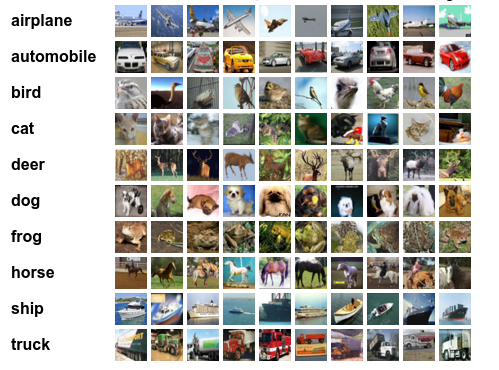

### Загрузка датасета

Таблица соответствий номеров ответов и классов:

| Label        | Class           |
| ------------- |:-------------:|
| 0     | Самолет |
| 1    | Автомобиль      |
| 2 | Птица      |
| 3 | Кошка      |
| 4 | Олень      |
| 5 | Собака      |
| 6 | Лягушка     |
| 7 | Лошадь     |
| 8 | Корабль     |
| 9 | Грузовик     |


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import torch
from torchvision import datasets, transforms

In [ ]:
train_data = datasets.CIFAR10(root="./cifar10_data", train=True, download=True, transform=transforms.ToTensor())
test_data = datasets.CIFAR10(root="./cifar10_data", train=False, download=True, transform=transforms.ToTensor())

100%|██████████| 170M/170M [00:03<00:00, 47.0MB/s]


Extracting ./cifar10_data/cifar-10-python.tar.gz to ./cifar10_data
Files already downloaded and verified


Выведем информацию о загруженных данных

In [ ]:
train_data

Dataset CIFAR10
    Number of datapoints: 50000
    Root location: ./cifar10_data
    Split: Train
    StandardTransform
Transform: ToTensor()

Поделим train_data на тренировочную и валидационную выборку:

In [ ]:
# в тренировочную выборку отнесем 80% всех картинок
# в валидационную — остальные 20%

train_size = int(len(train_data) * 0.8)
val_size = len(train_data) - train_size

train_data, val_data = torch.utils.data.random_split(train_data, [train_size, val_size])

Заведем DataLoader'ы для каждой части датасета:

In [ ]:
train_loader = torch.utils.data.DataLoader(train_data, batch_size=64, shuffle=True)
val_loader = torch.utils.data.DataLoader(train_data, batch_size=64, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=64, shuffle=False)

In [ ]:
def show_images(images, labels):
    f, axes= plt.subplots(1, 10, figsize=(30,5))

    for i, axis in enumerate(axes):
        # переводим картинку из тензора в numpy
        img = images[i].numpy()
        # переводим картинку в размерность (длина, ширина, цветовые каналы)
        img = np.transpose(img, (1, 2, 0))

        axes[i].imshow(img)
        axes[i].set_title(labels[i].numpy())

    plt.show()

for batch in train_loader:
    # батч картинок и батч ответов к картинкам
    images, labels = batch
    break

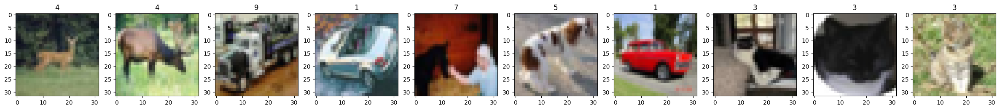

In [ ]:
show_images(images, labels)

### Нейронная сеть на pytorch

In [ ]:
# модуль, где определены слои для нейронных сетей
import torch.nn as nn
# модуль, где определены активации для слоев нейронных сетей
import torch.nn.functional as F
# метрика качества
from sklearn.metrics import accuracy_score

Объявим сверточную нейросеть.

Наша нейронная сеть будет содержать четыре слоя: два сверточных и два полносвязных. Также после первого сверточного слоя добавим pooling. В качестве функции активации для внутренних слоев будем использовать ReLU.

In [ ]:
class ConvNet(nn.Module):
    def __init__(self):
        super().__init__()

        # размер исходной картинки 32х32

        self.conv1 = nn.Conv2d(in_channels=3, out_channels=6, kernel_size=(3,3)) #30x30
        self.pool1 = nn.MaxPool2d(kernel_size=(2,2)) #15x15
        self.conv2 = nn.Conv2d(in_channels=6, out_channels=9, kernel_size=(3,3)) #13x13

        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(13 * 13 * 9, 128)
        self.fc2 = nn.Linear(128, 10)


    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)
        x = F.relu(self.conv2(x))

        x = self.flatten(x)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
conv_net = ConvNet().to(device)
device

device(type='cpu')

### Обучение нейронной сети

In [ ]:
# выбираем функцию потерь
loss_fn = torch.nn.CrossEntropyLoss()

# выбираем алгоритм оптимизации и learning_rate
learning_rate = 1e-3
optimizer = torch.optim.Adam(conv_net.parameters(), lr=learning_rate)

Напишем функцию обучения сети. На каждой итерации обучения будем сохранять значения лосса и accuracy на текущем батче. После каждой эпохи будем отрисовывать график изменения среднего лосса и accuracy с течением эпох обучения.

In [ ]:
from IPython.display import clear_output


def evaluate(model, dataloader, loss_fn):

    losses = []

    num_correct = 0
    num_elements = 0

    for i, batch in enumerate(dataloader):

        # так получаем текущий батч
        X_batch, y_batch = batch

        with torch.no_grad():
            logits = model(X_batch.to(device))

            loss = loss_fn(logits, y_batch.to(device))
            losses.append(loss.item())

            y_pred = torch.argmax(logits, dim=1).cpu()

            num_correct += torch.sum(y_pred == y_batch)
            num_elements += len(X_batch)

    accuracy = num_correct / num_elements

    return accuracy, np.mean(losses)

def train(model, loss_fn, optimizer, n_epoch=3):

    num_iter = 0

    # будем выводить результаты раз в 50 итераций обучения
    log_every=50

    # массивы, в которые будем сохранять средние значения лосса и accuracy
    # после каждой эпохи обучения
    train_losses = []
    val_losses = []
    train_acc = []
    val_acc = []

    # цикл обучения сети
    for epoch in range(n_epoch):

        print("Epoch:", epoch)

        model.train(True)

        # массивы, в которые будем сохранять значения лосса и accuracy
        # на каждой итерации текущей эпохи
        epoch_train_losses = []
        epoch_train_acc = []

        for i, batch in enumerate(train_loader):
            # так получаем текущий батч
            X_batch, y_batch = batch

            # forward pass (получение ответов на батч картинок)
            logits = model(X_batch.to(device))

            # вычисление лосса от выданных сетью ответов и правильных ответов на батч
            loss = loss_fn(logits, y_batch.to(device))


            loss.backward() # backpropagation (вычисление градиентов)
            optimizer.step() # обновление весов сети
            optimizer.zero_grad() # обнуляем веса

            num_iter += 1
            epoch_train_losses.append(loss.item())

            # вычислим accuracy на текущем train батче
            model_answers = torch.argmax(logits, dim=1).cpu()
            train_accuracy = torch.sum(y_batch == model_answers) / len(y_batch)
            epoch_train_acc.append(train_accuracy)

        # после каждой эпохи получаем метрику качества на валидационной выборке
        model.train(False)

        train_losses.append(np.mean(epoch_train_losses))
        train_acc.append(np.mean(epoch_train_acc))

        val_accuracy, val_loss = evaluate(model, val_loader, loss_fn=loss_fn)
        val_losses.append(val_loss)
        val_acc.append(val_accuracy)

        #########################
        # Отрисовка графика изменения значений лосса и accuracy по эпохам
        # удаляем предыдущую визуализацию
        clear_output(wait=True)

        # визуализируем графики тренировочного и валидационного лоссов и accuracy
        _, axes = plt.subplots(1, 2, figsize=(14, 7))
        axes[0].plot(range(len(train_losses)), train_losses, c='b')
        axes[1].plot(range(len(train_acc)), train_acc, c='b')
        axes[0].plot(range(len(val_losses)), val_losses, c='r')
        axes[1].plot(range(len(val_acc)), val_acc, c='r')
        axes[0].set_title('Loss, epochs done: '+str(epoch))
        axes[1].set_title('Accuracy, epochs done: '+str(epoch))

        plt.show()
        #########################

    return model

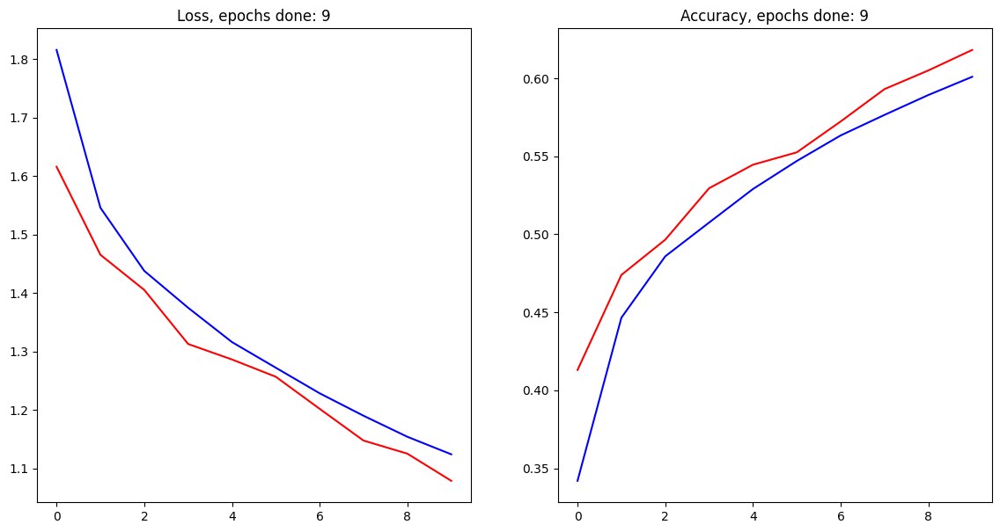

In [ ]:
conv_net = train(conv_net, loss_fn, optimizer, n_epoch=10)

Оценим качество на тренировочной и тестовой выборке

In [ ]:
train_accuracy, _ = evaluate(conv_net, train_loader, loss_fn)
print('Train accuracy is', train_accuracy)

Train accuracy is tensor(0.6182)


In [ ]:
test_accuracy, _ = evaluate(conv_net, test_loader, loss_fn)
print('Test accuracy is', test_accuracy)

Test accuracy is tensor(0.5696)


# Детекция и сегментация

Мы научились строить сверточные сети для задачи классификации картинок. Но кроме задачи классификации в компьютерном зрении существуют еще много разных типов задач. Рассмотрим две из них — ***детекцию*** и ***сегментацию***.

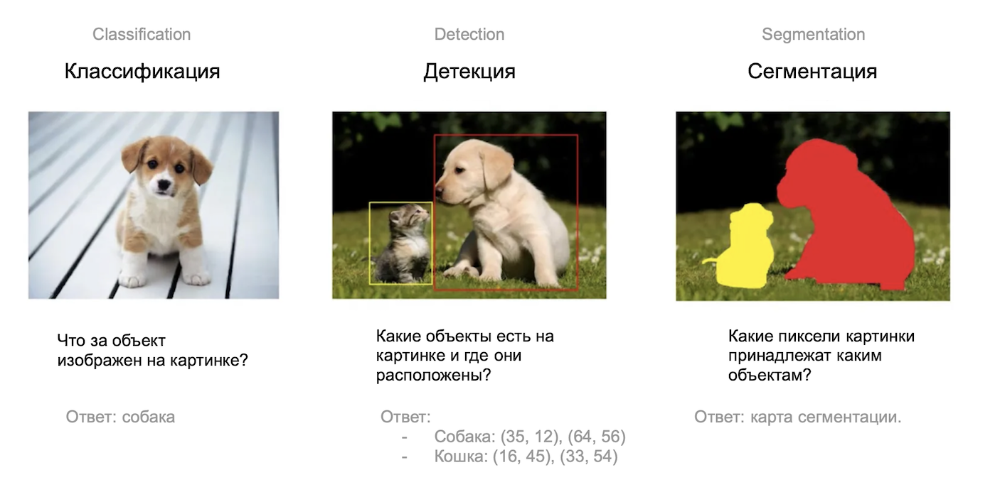

Задача сегментации тоже делится на несколько типов. Два самых распространенных типа — semantic segmentation (семантическая сегментация) и instance segmentation (инстанс-сегментация):
- в semantic segmentation нейросеть должна выделить пиксели объектов одного класса одним цветом;
- в instance segmentation нейросеть должна выделить пиксели разных объектов (даже если объекты одного класса) разными цветами;

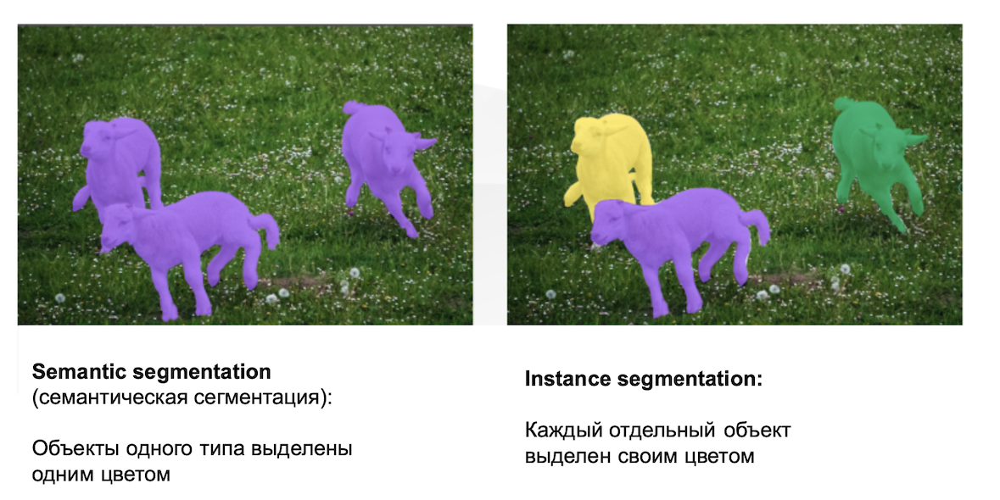

**Вход нейросети** — RGB картинка размера $h \times w \times 3$ (так же, как в задаче классификации). Выход нейросети — двумерная карта сегментации размера $h \times w$. Значение каждого пикселя карты сегментации — номер класса, которому принадлежит соответствующий пиксель исходной картинки.

На картинке могут быть объекты других классов, кроме тех, которые мы хотим сегментировать. Чтобы это учесть, добавим еще один класс сегментации: "фон". Ему будут соответствовать пиксели картинки, не принадлежащие ни одному из заданных классов.

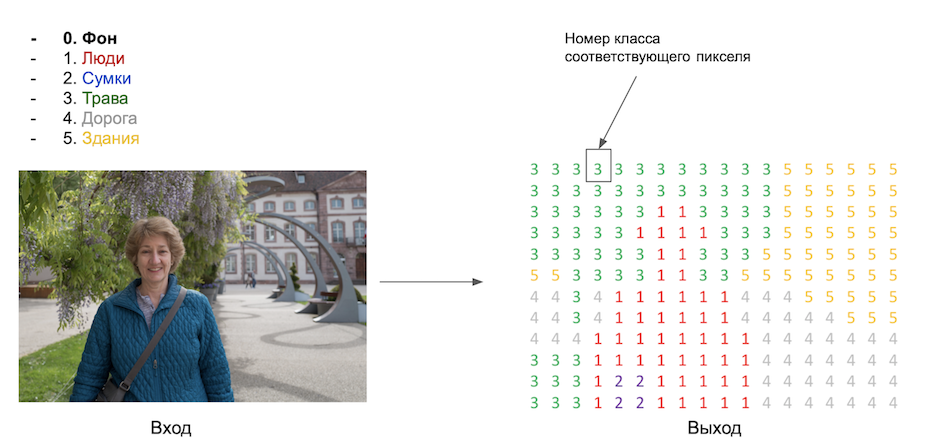

## Идеи решения задачи

### Идея №1: Скользящее окно

Пусть у нас есть картинка, которую мы хотим сегментировать. Будем проходиться по ней скользящим окном небольшого размера (например, семь на семь). В каждом положении скользящего окна будем подавать кусок картинки размера семь на семь, которую закрывает окно, на вход нейросети для классификации. Эта нейросеть будет одна и та же для всех положений скользящего окна. Задача этой нейросети — классифицировать центральный пиксель этого куска картинки на шесть классов. Понять, какому объекту из тех, что мы хотим сегментировать, этот пиксель принадлежит.



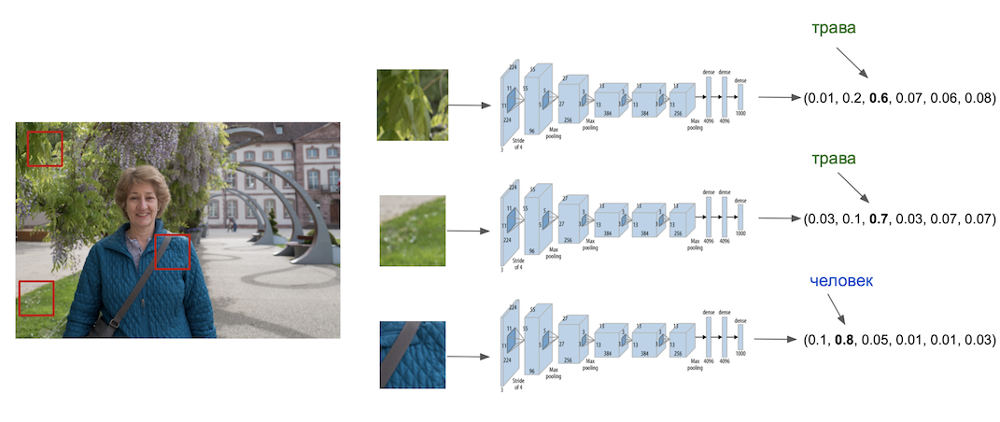

#### Недостатки
**Идея простая, но у нее есть довольно серьезные недостатки.**

1. Первый, самый очевидный — каждый патч картинки часто содержит очень малую часть объекта, по которой сложно, а иногда и практически невозможно понять, что на этом патче изображено. Посмотрим, например, на нижний патч на картинке выше. Согласитесь, даже для человека совсем не понятно, что это — часть куртки человека. Нейросеть на таких патчах тоже, конечно же, будет ошибаться.

2. Часто объекты имеют довольно большой размер, и чтобы эффективно классифицировать все пиксели этих объектов, скользящее окно должно быть довольно больших размеров. Настолько большим, чтобы, в идеале, захватывать весь объект целиком. Но в этом случае усугубляется вторая проблема такого алгоритма: он становится очень долгим. Чтобы сегментировать одну картинку размера 32х32, нам нужно тысячу раз прогнать патч через сеть для классификации. Тысяча вызовов алгоритма — это довольно много, и работать это будет долго. А представьте, если у нас картинки больших размеров? А если при этом сделать размер патча больше, то сеть для классификации начнет работать еще дольше, и одна сегментация одной картинки станет занимать огромное количество времени и вычислительных ресурсов. Выходит, подобный алгоритм неэффективен как с точки зрения качества сегментации, так и с точки зрения времени работы.

### Идея №2: FCN

Зададим сверточную нейросеть, у которой все карты активации будут иметь размер исходной картинки. И в последнем сверточном слое будет C карт активаций, где С — количество классов сегментации в нашей задаче. Полносвязных слоев у такой сети не будет. Такие сети, которые состоят только из сверточных слоев, называются **fully-convolutional network**.

Будем обучать эту нейросеть так, чтобы последние карты активации содержали ответ задачи сегментации на входящую картинку. Итоговая двумерная карта сегментации получается тем, что мы берем аргмаксимум по третьей размерности выхода сети.

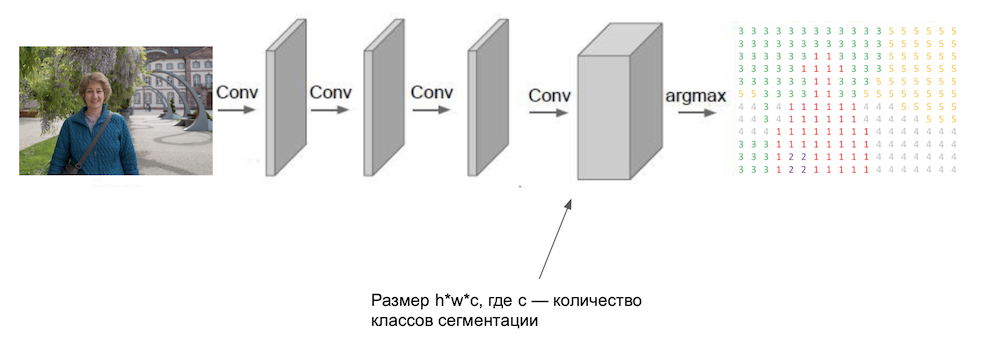

Эта идея будет работать, но и у нее есть существенный недостаток. Он снова связан с тем, что такая нейросеть будет работать очень долго. Если картинка, которую вы подаете на вход модели, большого размера, то и все карты активации на всех этапах работы сети будут такого же большого размера. А для вычисления таких больших карт активации требуется много вычислительных ресурсов.

Значит, **мы хотим как-то сократить количество вычислений, которые нейросеть делает в процессе сегментации.**

### Идея №3: Upsampling

Чтобы уменьшить количество вычислений, давайте все же будем уменьшать размеры карт активаций при движении к концу сети. Выход нейросети будет размера $h' \times w’ \times c$, где $h’$ и $w’$ — размеры карт активаций последнего слоя, c — количество классов сегментации. По сути, нейросеть будет выдавать уменьшенную версию карты сегментации. Ну или карту сегментации для уменьшенной изначальной картинки.

После этого мы эту карту сегментации будем увеличивать до оригинального размера картинки. Увеличивать будем простым алгоритмом upsampling, по сути, просто растягивая полученную картинку по длине и ширине.

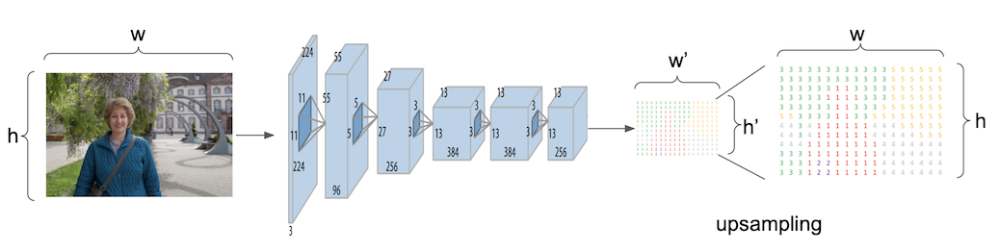

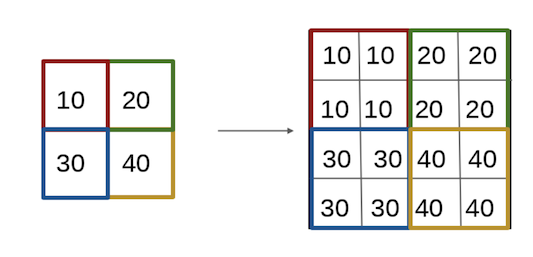

У этого алгоритма есть очевидный недостаток: точность его работы. Алгоритм предсказывает карту сегментации для уменьшенной версии исходной картинки, и от этого теряются детали, и сегментация получается очень неточной.



Однако этот алгоритм довольно долго использовался для решения задачи сегментации. И люди за время придумали, как улучшить точность итоговой карты сегментации с помощью специального алгоритма для постобработки результата. Он называется conditional random fields, сокращенно CRF. И он улучшал качество сегментации довольно сильно.

Вот пример того, какой могла получиться карта сегментации на выходе нейросети и после применения CRF:



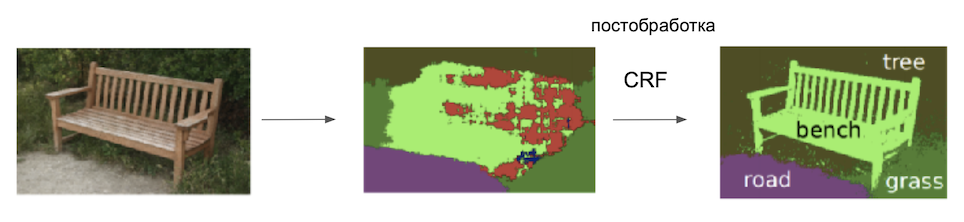

Давайте обратим внимание на две последние идеи (fully-convolutional network и CNN + upsampling). В идеале нам бы хотелось получить что-то среднее между ними: нейросеть, которая была бы способна выдавать хорошую карту сегментации того же размера, что изначальная картинка, но при этом у нее не было бы такое большое количество параметров, как у fully-convolutional network.

По сути, **мы хотели бы придумать более умную замену upsampling'у**. И сейчас мы поймем, как это сделать. Для этого изучим новый слой: transposed convolution.

## Transposed Convolution

**Transposed convolution — обучаемая замена алгоритму upsampling**. Transposed convolution — слой, который увеличивает размеры карт активаций (а не уменьшает их размер, как обычный сверточный слой). Как понятно из названия, слой transposed convolution основан на свертках.

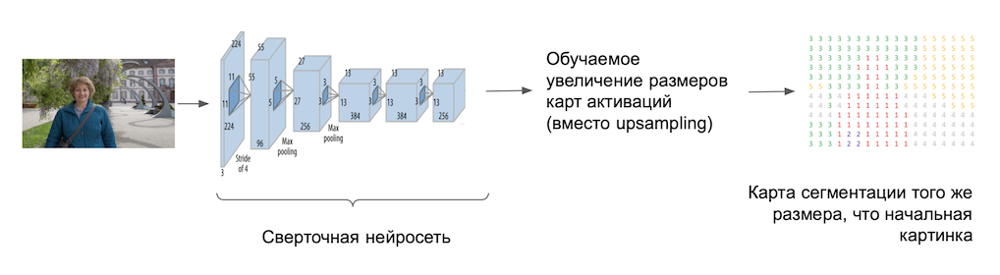

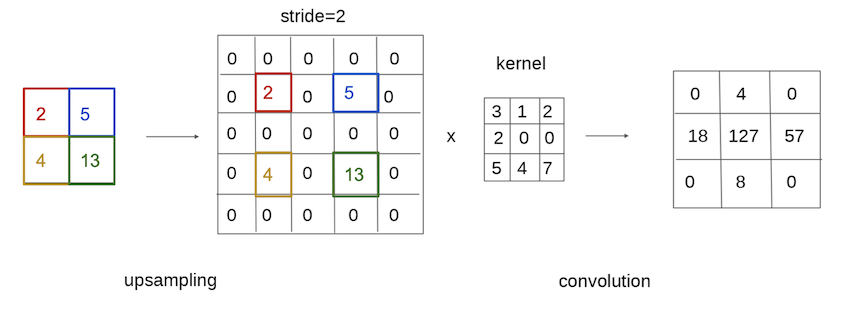

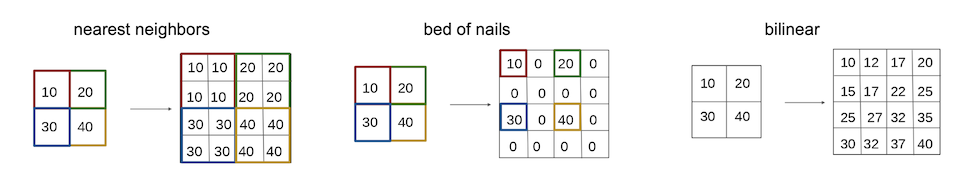

Обучаемыми параметрами слоя transposed convolution являются все веса всех фильтров. Upsampling не является обучаемым.

Слой transposed convolution также часто называют deconvolution. Строго это неправильно: операция transposed convolution не является обратной к операции convolution. Но в литературе часто можно встретить название deconvolution применительно к transposed convolution.

## Segnet и Unet

Таким образом, вместо простого upsampling в нейросети мы можем использовать слои transposed convolution (т.е. слои upsampling+conv). В итоге схему нейросети можно проиллюстрировать так:



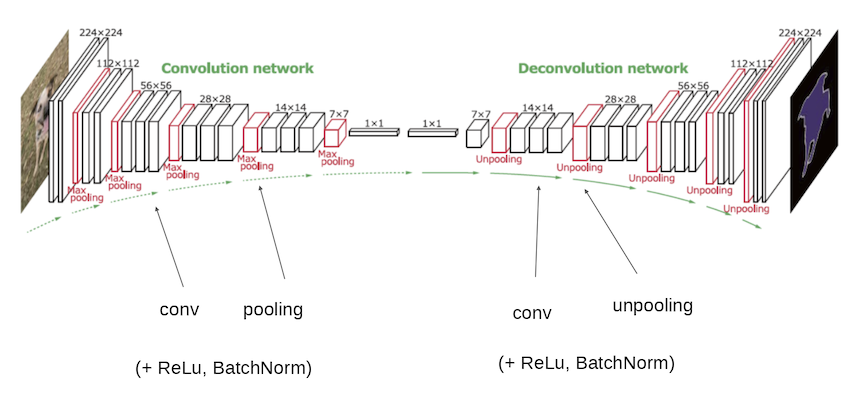

У такой нейросети можно условно выделить две части: encoder (левая часть, свертки) и decoder (правая часть, transposed convolution). Чаще всего encoder и decoder делают симметричными: каждый слой upsampling в декодере соответствует слою pooling в енкодере, а каждый слой conv в декодере — слою conv в енкодере.

Такая архитектура нейросети — классическая для решения задачи сегментации. Она называется SegNet.

### Unet
U-Net — это нейросеть на основе SegNet со skip connection.

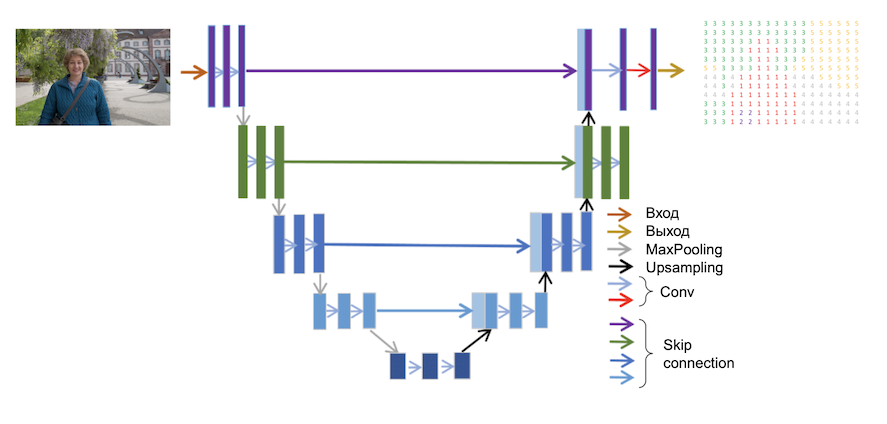

Skip connection проводится из выхода каждого блока левой части на вход соответствующему ему блоку правой части сети. Получается, блок правой части принимает на вход сумму карт активаций, пришедних из предыдушего слоя и из симметричного блока левой части сети.

Такая идея помогает нейросети создавать лучшие, более четкие карты сегментации. Смотрите, в нашей сети в середине есть узкое место: там, где карты активации сужаются и становятся малого размера. Такое место обычно называется bottleneck, то есть, бутылочное горлышко. И информация из изначальной картинки, когда она течет по сети, проходит через это узкое место, и часть информации там может теряться. Например, скорее всего, будет потеряна информация о мелких деталях исходного изображения. И когда затем слои транспонированной свертки правой части сети обратно восстанавливают изображение исходного размера, им может не хватать информации, полученной из последних слоев левой части, чтобы четко и качественно построить карту сегментации. Мелкие объекты, например, будут сегментированы плохо.

Применение такого skip connection помогает слоям правой части сети получить дополнительную информацию о том, как устроено исходное изображение. Это помогает получить более точную карту сегментации.

Такая нейросеть для сегментации со skip connection называется U-Net. U — потому что в такой иллюстрации сеть похожа на английскую букву U.


## Пример: сегментация

Мы будем решать задачу бинарной сегментации родинок и меланом. Данные [можно скачать тут](https://disk.yandex.com/d/3hvHKFeex6j42Q). Также ниже есть ячейка, которая автоматически скачивает данные.

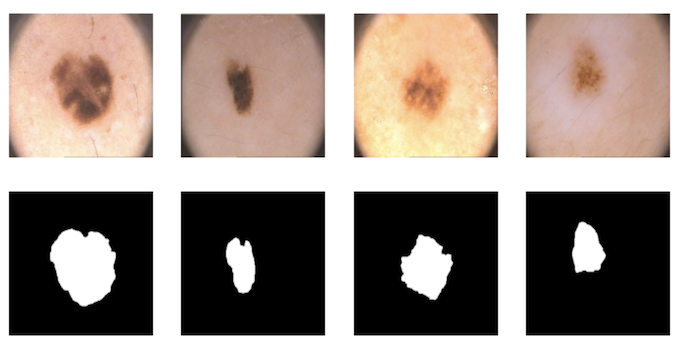

In [ ]:
! pip install wldhx.yadisk-direct
! curl -L $(yadisk-direct https://disk.yandex.com/d/3hvHKFeex6j42Q) -o PH2.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:--  0:00:01 --:--:--     0
100  203M  100  203M    0     0  17.8M      0  0:00:11  0:00:11 --:--:-- 26.0M


In [ ]:
! unzip -qq PH2.zip

### Решение

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import torch
from torch.utils.data import Dataset, DataLoader
from torch import nn
from torch.nn import functional as F
from torchvision import transforms

Чтобы обучить нейросеть на этих данных, нам нужно их загрузить самостоятельно. Давайте это сделаем:

In [ ]:
# библиотека для удобной работы с файлами на диске
import os
# библиотека для считывания картинок
from PIL import Image

# в эти массивы будем сохранять RGB картинки
# и их соответствующие карты сегментации
images = []
lesions = []

# название папки, в которой лежат данные
root = 'PH2 Dataset images'

# проходимся по всем подпапкам и файлам внутри директории root
for dirname, _, files in os.walk(root):
    # если название папки заканчивается на _Dermoscopic_Image,
    # то в ней лежит RGB картинка
    if dirname.endswith('_Dermoscopic_Image'):
        images.append(Image.open(os.path.join(dirname, files[0])))
    # если название папки заканчивается на _lesion,
    # то в ней лежит карта сегментации
    if dirname.endswith('_lesion'):
        lesions.append(Image.open(os.path.join(dirname, files[0])))

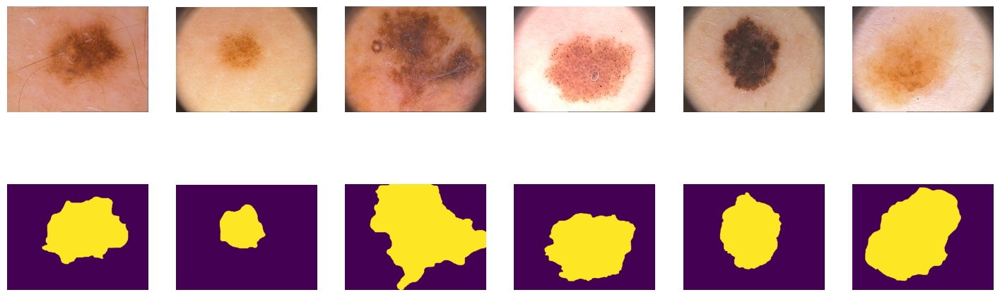

In [ ]:
plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(np.array(images[i]))

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(np.array(lesions[i]))
plt.show();

Чтобы работать с данными для сегментации, нужно создать свой класс датасет.

In [ ]:
class PH2(Dataset):
    def __init__(self, images, lesions):

        self.images = images
        self.lesions = lesions

        self.img_transforms = transforms.Compose([
            transforms.Resize((256, 256)), # размер каждой картинки будет приведен к 256*256
            transforms.ToTensor(), # картинка из питоновского массива переводится в формат torch.Tensor
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) # значения пикселей картинки нормализуются
        ])

        self.seg_transforms = transforms.Compose([
            transforms.Resize((256, 256), interpolation=transforms.InterpolationMode.NEAREST), # размер каждой картинки будет приведен к 256*256
            transforms.ToTensor(), # картинка из питоновского массива переводится в формат torch.Tensor
        ])

    def __getitem__(self, index):

        # находим по индексу нужные картинку и ее карту сегментации
        img = self.images[index]
        mask = self.lesions[index]

        # применяем предобработку к RGB картинке
        img = self.img_transforms(img)
        # применяем предобработку к маске сегментации
        mask = self.seg_transforms(mask)

        # возвращаем пару: картинка — ее маска сегментации
        return (img, mask)

    def __len__(self):
        '''
        этот метод должен возвращать количество пар картинка-сегментация в датасете
        '''
        return len(self.images)

In [ ]:
data = PH2(images, lesions)
len(data)

200

Разделим наш датасет на три части: train, val и test:

In [ ]:
train_size = 100
val_size = 50
test_size = 50

train_data, val_data, test_data = torch.utils.data.random_split(data, [train_size, val_size, test_size])

In [ ]:
batch_size = 16
train_loader = DataLoader(train_data,
                     batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_data,
                      batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_data,
                     batch_size=batch_size, shuffle=False)

#### Архитектура сети SegNet

In [ ]:
class SegNet(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder. conv + pooling
        self.enc_conv0 = nn.Conv2d(in_channels=3, out_channels=6, kernel_size=(3,3), padding=1) # 256x256
        self.pool0 = nn.MaxPool2d(kernel_size=(2,2)) # 256 -> 128
        self.enc_conv1 = nn.Conv2d(in_channels=6, out_channels=9, kernel_size=(3,3), padding=1) # 128x128
        self.pool1 = nn.MaxPool2d(kernel_size=(2,2)) # 128 -> 64
        self.enc_conv2 = nn.Conv2d(in_channels=9, out_channels=12, kernel_size=(3,3), padding=1) # 64x64
        self.pool2 = nn.MaxPool2d(kernel_size=(2,2)) # 64 -> 32
        self.enc_conv3 = nn.Conv2d(in_channels=12, out_channels=15, kernel_size=(3,3), padding=1) # 32x32
        self.pool3 = nn.MaxPool2d(kernel_size=(2,2)) # 32 -> 16

        # bottleneck (середина, самая узнкая часть сети)
        self.bottleneck_conv = nn.Conv2d(in_channels=15, out_channels=15, kernel_size=(3,3), padding=1) # 16x16

        # decoder. upsample + conv
        self.upsample0 = nn.Upsample(scale_factor=2, mode='bilinear') # 16 -> 32
        self.dec_conv0 = nn.Conv2d(in_channels=15, out_channels=12, kernel_size=(3,3), padding=1) # 32x32
        self.upsample1 = nn.Upsample(scale_factor=2, mode='bilinear') # 32 -> 64
        self.dec_conv1 = nn.Conv2d(in_channels=12, out_channels=9, kernel_size=(3,3), padding=1) # 64x64
        self.upsample2 = nn.Upsample(scale_factor=2, mode='bilinear') # 64 -> 128
        self.dec_conv2 = nn.Conv2d(in_channels=9, out_channels=6, kernel_size=(3,3), padding=1) # 128x128
        self.upsample3 = nn.Upsample(scale_factor=2, mode='bilinear') # 128 -> 256
        self.dec_conv3 = nn.Conv2d(in_channels=6, out_channels=1, kernel_size=(3,3), padding=1) # 256x256

    def forward(self, x):
        # encoder
        e0 = self.pool0(F.relu(self.enc_conv0(x)))
        e1 = self.pool1(F.relu(self.enc_conv1(e0)))
        e2 = self.pool2(F.relu(self.enc_conv2(e1)))
        e3 = self.pool3(F.relu(self.enc_conv3(e2)))

        # bottleneck
        b = self.bottleneck_conv(e3)

        # decoder
        d0 = F.relu(self.dec_conv0(self.upsample0(b)))
        d1 = F.relu(self.dec_conv1(self.upsample1(d0)))
        d2 = F.relu(self.dec_conv2(self.upsample2(d1)))
        # сигмоидная функция активации, потому что у нас задача
        # бинарной сегментации
        # в случае многоклассовой сегментации был бы softmax
        d3 = F.sigmoid(self.dec_conv3(self.upsample3(d2)))
        return d3

#### Обучение

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

In [ ]:
from IPython.display import clear_output

def train(model, opt, loss_fn, epochs, train_loader, val_loader):

    for epoch in range(epochs):
        # печатаем номер текущей эпохи
        print('* Epoch %d/%d' % (epoch+1, epochs))

        # 1. Обучаем сеть на картинках из train_loader
        model.train()  # train mode

        avg_train_loss = 0
        for i, (X_batch, Y_batch) in enumerate(train_loader):
            # переносим батч на GPU
            X_batch, Y_batch = X_batch.to(device), Y_batch.to(device)
            # получаем ответы сети на батч
            Y_pred = model(X_batch)

            # считаем лосс, делаем шаг оптимизации сети
            loss = loss_fn(Y_pred, Y_batch)
            loss.backward()
            opt.step()
            opt.zero_grad()

            avg_train_loss += loss / len(train_loader)

        # выводим средний лосс на тренировочной выборке за эпоху
        print('avg train loss: %f' % avg_train_loss)

        # 2. Тестируем сеть на картинках из val_loader
        model.eval()

        avg_val_loss = 0
        for i, (X_batch, Y_batch) in enumerate(val_loader):
            # переносим батч на GPU
            X_batch, Y_batch = X_batch.to(device), Y_batch.to(device)
            # получаем ответы сети на батч
            Y_pred = model(X_batch)
            # считаем лосс на батче
            loss = loss_fn(Y_pred, Y_batch)

            avg_val_loss += loss / len(val_loader)

        # выводим средний лосс на валидационных данных
        print('avg val loss: %f' % avg_val_loss)


        # 3. Визуализируем ответы сети на шести картинках из валидационных данных

        # получаем один батч из data_val
        X_val, Y_val = next(iter(val_loader))
        # получаем ответ сети на картинки из батча
        Y_pred = model(X_val.to(device))
        Y_pred = Y_pred.detach().cpu().numpy()

        # удаляем предыдущую визуализацию
        clear_output(wait=True)

        # визуализируем исходные картинки, верный ответ и ответ нашей модели
        _, axes = plt.subplots(3, 6, figsize=(6*4, 3*4))
        for k in range(6):
            # отрисовываем 6 картинок, поданных на вход сети
            # картинки нормализованы, поэтому могут выглядеть непривычно
            axes[0][k].imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray', aspect='auto')
            axes[0][k].title.set_text('Input')

            # отрисовываем правильные маски сегментации для шести картинок выше
            axes[1][k].imshow(Y_val[k].numpy()[0], cmap='gray', aspect='auto')
            axes[1][k].title.set_text('Real Map')

            # отрисовываем ответы сети для каждого из четырех классов сегментации в отдельности
            axes[2][k].imshow(Y_pred[k][0], cmap='gray', aspect='auto')
            axes[2][k].title.set_text('Output')
        plt.suptitle('%d / %d - val loss: %f' % (epoch+1, epochs, avg_val_loss))
        plt.show()

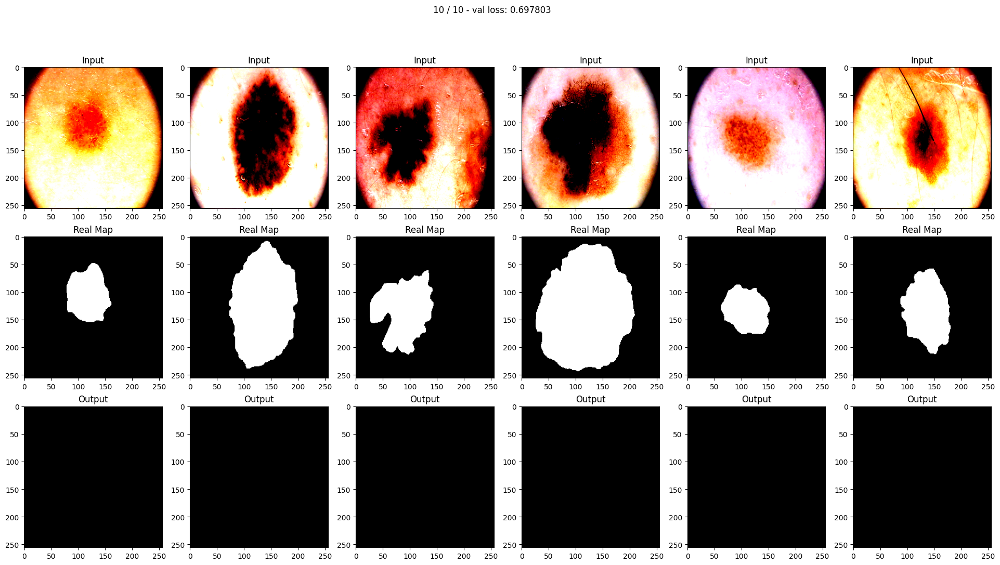

In [ ]:
model = SegNet().to(device)
# бинарная кросс-энтропия
loss = nn.BCELoss()
opt = torch.optim.Adam(model.parameters(), lr=1e-3)
train(model, opt, loss, 10, train_loader, val_loader)

### Метрика качества IoU

IoU — одна из стандартных метрик качества, которые используются в задаче сегментации.

Формула подсчета метрики:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Здесь:
- Пересечение (A ∩ B) — количество пикселей, которые помечены как пиксели объекта (т.е. имеют значение 1 в маске сегментации) *как* в маске предсказания модели, *так и *в правильной маске сегментации;
- Объединение (A ∪ B) — количество пикселей, которые помечены как пиксели объекта (т.е. имеют значение 1 в маске сегментации) *либо* в маске предсказания модели, *либо* в правильной маске сегментации;

И значение метрики IoU — это количество пикселей пересечения, деленное на количество пикселей объединения. Чем это значение больше, тем качество сегментации моделью лучше.

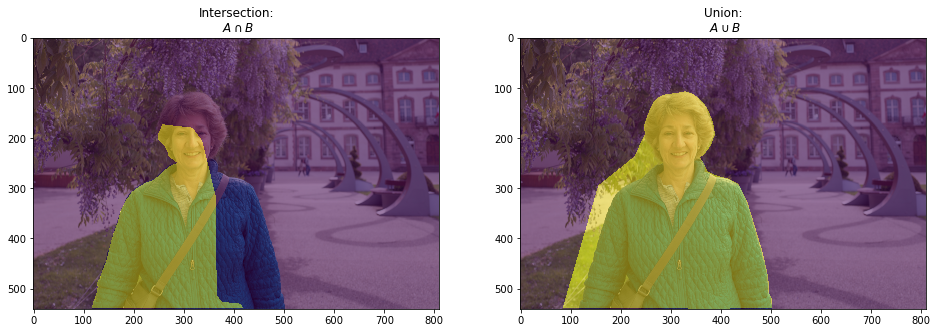

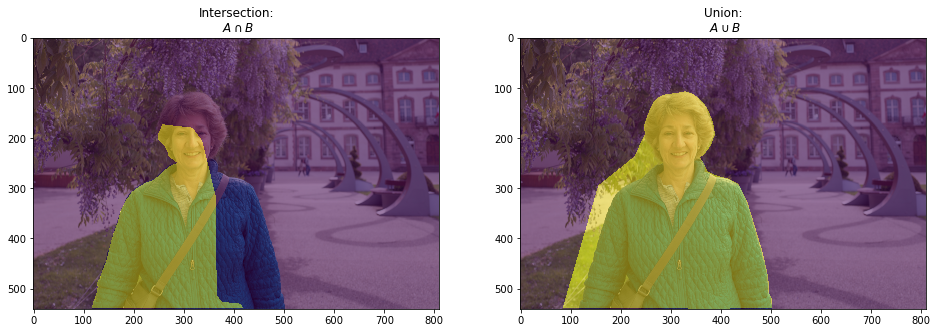

In [ ]:
! pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 927.3/927.3 kB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 22.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 53.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [ ]:
from torchmetrics import JaccardIndex

X_val, Y_val = next(iter(val_loader))
# получаем ответ сети на картинки из батча
Y_pred = model(X_val.to(device))

jaccard = JaccardIndex(task='binary').to('cpu')
jaccard(Y_pred.to('cpu'), Y_val.to('cpu'))

tensor(0.3343)

In [ ]:
device = 'cpu'
def evaluate(model, dataloader, loss_fn, metric_fn):

    losses = []
    metrics = []

    for i, batch in enumerate(dataloader):

        # получаем текущий батч
        X_batch, y_batch = batch
        X_batch = X_batch.to(device)
        y_batch = y_batch.to(device)

        with torch.no_grad():
            # получаем выход модели
            logits = model(X_batch)

            # считаем лосс по батчу
            loss = loss_fn(logits, y_batch)
            losses.append(loss.item())

            # считаем метрику по батчу
            metric = metric_fn(logits.to('cpu'), y_batch.to('cpu'))
            metrics.append(metric.item())

    # возвращает средние значения лосса и метрики
    return np.mean(losses), np.mean(metrics)

In [ ]:
evaluate(model, train_loader, loss, jaccard)

(0.6999329328536987, 0.3612070083618164)

In [ ]:
evaluate(model, val_loader, loss, jaccard)

(0.6978026777505875, 0.4066176414489746)

In [ ]:
evaluate(model, test_loader, loss, jaccard)

(0.7060350775718689, 0.2311232089996338)

## Детекция

Даны классы объектов, которые мы хотим детектировать:
- кошка;
- собака;
- человек;
- ...

На вход нейросети подается RGB картинка (так же, как и в задаче классификации). На выходе нейросеть выдает набор пар (класс, координаты bounding box).
- (собака, [35, 12], [64, 56]);
- (кошка, [16, 45], [33, 54]);
- ...

Координата каждого bounding box — это пара [x1, y1], [x2, y2], где [x1, y1] — координаты левого верхнего угла bounding box'а, [x2, y2] — координаты правого нижнего угла bounding box'а.

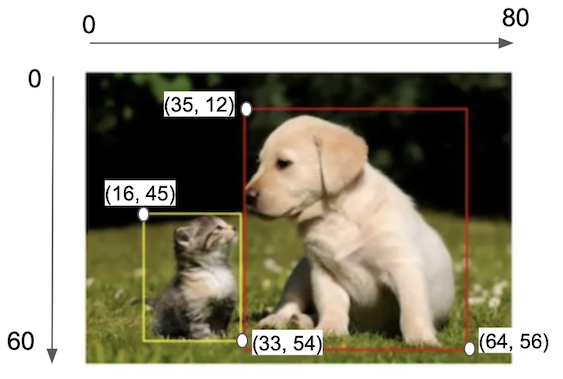

Иногда координаты bounding box'ов кодируют по-другому: парой [x1, y1], [w, h], где [x1, y1] — координаты левого верхнего угла bounding box'а, [w, h] — ширина и длина bounding box'а:

### YOLO

**Real-time-алгоритмы** - это алгоритмы, которые должны анализировать входной поток информации в режиме онлайн, то есть быстро выдавать результаты обработки большого числа изображений (или других форматов входных данных) в порядке их поступления. Примером real-time сегментации может служить построение масок сегментации для беспилотных автомобилей.

Для real-time детекции не подходят решения, основанные на переборе большого количества потенциальных bound boxes. Поэтому была придумана другая идея нейросети для детекции: **YOLO ("You Only Look Once")**. Нейросети на основе YOLO используются для real-time детекции и по сей день.

Главная фишка YOLO — она требует только одного прогона нейросети для детекции всех объектов на картинке.

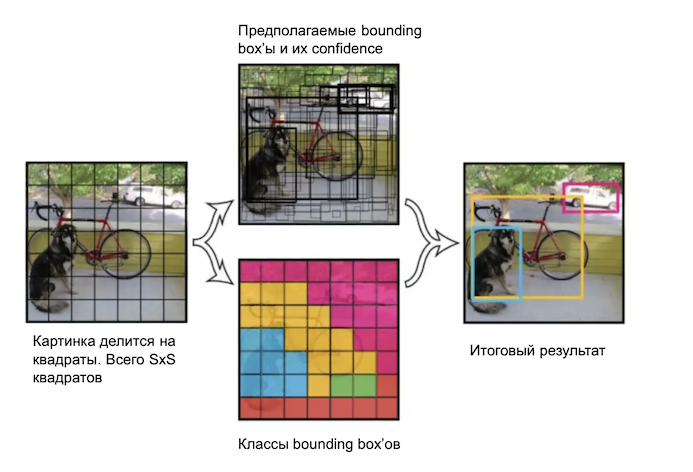

Идея работы YOLO:
1. Исходная картинка разбивается на патчи фиксированного размера. Всего SxS патчей;
2. Картинка подается на вход нейросети. Задача этой нейросети — для каждого из SxS патчей выдать b предполагаемых bounding box'ов. И для каждого bounding box'а выдать его координаты [x1, y1], [x2, y2] и confidence (уверенность) в том, что этот bounding box верный. Кроме этого, сеть для каждого патча должна выдать класс объекта, который находится в этом патче. Выходит, всего нейросеть выдает тензор размера SxSx(5b+c), где с — количество классов детекции.
3. Из всех SxSx5b bounding box'ов остаются только те, для которых confidence выше некоторого порога. Это и есть итоговый результат.

Этот алгоритм работает очень быстро, и пригоден для real-time детекции. По сей день исследователи продолжают придумывать идеи, как сделать YOLO еще быстрее.

Главный недостаток этого алгоритма — то, что он не может детектировать очень маленькие объекты. Для каждого патча в итоге остается только один bounding box. Если внутри одного патча помещались два или более объектов, детектирован может быть только один из них.